<img src="http://imgur.com/1ZcRyrc.png" style="float: left; margin: 15px; height: 80px">

# Project 3

### Regression and Classification with the Ames Housing Data

---

You have just joined a new "full stack" real estate company in Ames, Iowa. The strategy of the firm is two-fold:
- Own the entire process from the purchase of the land all the way to sale of the house, and anything in between.
- Use statistical analysis to optimize investment and maximize return.

The company is still small, and though investment is substantial the short-term goals of the company are more oriented towards purchasing existing houses and flipping them as opposed to constructing entirely new houses. That being said, the company has access to a large construction workforce operating at rock-bottom prices.

This project uses the [Ames housing data recently made available on kaggle](https://www.kaggle.com/c/house-prices-advanced-regression-techniques).

In [1]:
import numpy as np
import scipy.stats as stats
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

sns.set_style('whitegrid')

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

<img src="http://imgur.com/l5NasQj.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## 1. Estimating the value of homes from fixed characteristics.

---

Your superiors have outlined this year's strategy for the company:
1. Develop an algorithm to reliably estimate the value of residential houses based on *fixed* characteristics.
2. Identify characteristics of houses that the company can cost-effectively change/renovate with their construction team.
3. Evaluate the mean dollar value of different renovations.

Then we can use that to buy houses that are likely to sell for more than the cost of the purchase plus renovations.

Your first job is to tackle #1. You have a dataset of housing sale data with a huge amount of features identifying different aspects of the house. The full description of the data features can be found in a separate file:

    housing.csv
    data_description.txt
    
You need to build a reliable estimator for the price of the house given characteristics of the house that cannot be renovated. Some examples include:
- The neighborhood
- Square feet
- Bedrooms, bathrooms
- Basement and garage space

and many more. 

Some examples of things that **ARE renovate-able:**
- Roof and exterior features
- "Quality" metrics, such as kitchen quality
- "Condition" metrics, such as condition of garage
- Heating and electrical components

and generally anything you deem can be modified without having to undergo major construction on the house.

---

**Your goals:**
1. Perform any cleaning, feature engineering, and EDA you deem necessary.
- Be sure to remove any houses that are not residential from the dataset.
- Identify **fixed** features that can predict price.
- Train a model on pre-2010 data and evaluate its performance on the 2010 houses.
- Characterize your model. How well does it perform? What are the best estimates of price?

> **Note:** The EDA and feature engineering component to this project is not trivial! Be sure to always think critically and creatively. Justify your actions! Use the data description file!

In [2]:
# Load the data
house = pd.read_csv('./housing.csv')

text_file = open('./data_description.txt')
file_content = text_file.read()
print(file_content)
text_file.close()


MSSubClass: Identifies the type of dwelling involved in the sale.	

        20	1-STORY 1946 & NEWER ALL STYLES
        30	1-STORY 1945 & OLDER
        40	1-STORY W/FINISHED ATTIC ALL AGES
        45	1-1/2 STORY - UNFINISHED ALL AGES
        50	1-1/2 STORY FINISHED ALL AGES
        60	2-STORY 1946 & NEWER
        70	2-STORY 1945 & OLDER
        75	2-1/2 STORY ALL AGES
        80	SPLIT OR MULTI-LEVEL
        85	SPLIT FOYER
        90	DUPLEX - ALL STYLES AND AGES
       120	1-STORY PUD (Planned Unit Development) - 1946 & NEWER
       150	1-1/2 STORY PUD - ALL AGES
       160	2-STORY PUD - 1946 & NEWER
       180	PUD - MULTILEVEL - INCL SPLIT LEV/FOYER
       190	2 FAMILY CONVERSION - ALL STYLES AND AGES

MSZoning: Identifies the general zoning classification of the sale.
		
       A	Agriculture
       C	Commercial
       FV	Floating Village Residential
       I	Industrial
       RH	Residential High Density
       RL	Residential Low Density
       RP	Residential Low Density Park 
       RM

### Perform EDA and Data Cleansing

In [3]:
print(house.shape)
print(house.columns)
print(house.info())

(1460, 81)
Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 

In [4]:
print(house.describe().T)

                count           mean           std      min        25%  \
Id             1460.0     730.500000    421.610009      1.0     365.75   
MSSubClass     1460.0      56.897260     42.300571     20.0      20.00   
LotFrontage    1201.0      70.049958     24.284752     21.0      59.00   
LotArea        1460.0   10516.828082   9981.264932   1300.0    7553.50   
OverallQual    1460.0       6.099315      1.382997      1.0       5.00   
OverallCond    1460.0       5.575342      1.112799      1.0       5.00   
YearBuilt      1460.0    1971.267808     30.202904   1872.0    1954.00   
YearRemodAdd   1460.0    1984.865753     20.645407   1950.0    1967.00   
MasVnrArea     1452.0     103.685262    181.066207      0.0       0.00   
BsmtFinSF1     1460.0     443.639726    456.098091      0.0       0.00   
BsmtFinSF2     1460.0      46.549315    161.319273      0.0       0.00   
BsmtUnfSF      1460.0     567.240411    441.866955      0.0     223.00   
TotalBsmtSF    1460.0    1057.429452  

In [5]:
house.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [6]:
# Convert numeric categories to string to facilitate regression

MSclass_dict = {20:'1-STORY 1946 & NEWER ALL STYLES',30:'1-STORY 1945 & OLDER',40:'1-STORY W/FINISHED ATTIC ALL AGES',
           45:'1-1/2 STORY - UNFINISHED ALL AGES',50:'1-1/2 STORY FINISHED ALL AGES',60:'2-STORY 1946 & NEWER',
           70:'2-STORY 1945 & OLDER',75:'2-1/2 STORY ALL AGES',80:'PLIT OR MULTI-LEVEL',85:'SPLIT FOYER',
           90:'DUPLEX - ALL STYLES AND AGES',120:'1-STORY PUD (Planned Unit Development) - 1946 & NEWER',
           150:'1-1/2 STORY PUD - ALL AGES',160:'2-STORY PUD - 1946 & NEWER',180:'PUD - MULTILEVEL - INCL SPLIT LEV/FOYER',
           190:'2 FAMILY CONVERSION - ALL STYLES AND AGES'}

house['MSSubClass'] = house['MSSubClass'].map(MSclass_dict)


# Condition_dict = {10:'Very Excellent',9:'Excellent',8:'Very Good',7:'Good',6:'Above Average',5:'Average',4:'Below Average',
#                  3:'Fair',2:'Poor',1:'Very Poor'}           

# house['OverallQual'] = house['OverallQual'].map(Condition_dict)
# house['OverallCond'] = house['OverallCond'].map(Condition_dict)


In [7]:
# Add suffix"_2nd" to Condition 2 for categorisation subsequently during regression

house['Condition2'] = [str(x) + '_2nd' for x in house['Condition2']]

In [8]:
# Add suffix"_2nd" to Exterior2nd for categorisation subsequently during regression

house['Exterior2nd'] = [str(x) + '_2nd' for x in house['Exterior2nd']]

In [9]:
house.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,2-STORY 1946 & NEWER,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm_2nd,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd_2nd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,1-STORY 1946 & NEWER ALL STYLES,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm_2nd,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd_2nd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,2-STORY 1946 & NEWER,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm_2nd,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd_2nd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,2-STORY 1945 & OLDER,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm_2nd,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng_2nd,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,2-STORY 1946 & NEWER,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm_2nd,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd_2nd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [10]:
# Remove houses that are non residential i.e. where MSZoning = 'A','C' and 'I'
# Unique() search indicates only commercial ppty (denoted C (all)) is in dataframe. 

house.drop(house[house['MSZoning'] == 'C (all)'].index, inplace = True)

house['MSZoning'].unique()

array(['RL', 'RM', 'FV', 'RH'], dtype=object)

### Some categorical data can be represented by numeric data.
- e.g. Ranking categorical can be updated to 5 for Excellent to 1 for Poor
- e.g. Certain categorical variables with only 2 uniques like 'Street' can use 1 to rep Pave, 0 for Grvl and Central Air Conditioning 1 for Yes, 0 for No

In [11]:
print(house['Street'].unique())
print(house['CentralAir'].unique())

['Pave' 'Grvl']
['Y' 'N']


In [12]:
house['Street'].replace({'Pave':1,'Grvl':0}, inplace = True)
house['CentralAir'].replace({'Y':1,'N':0}, inplace = True)

In [13]:
print(house['Street'].unique())
print(house['CentralAir'].unique())

[1 0]
[1 0]


In [14]:
ranking_dict = {'Ex':5,'Gd':4,'TA':3,'Fa':2,'Po':1}

house['ExterQual'].replace({'Ex':5,'Gd':4,'TA':3,'Fa':2,'Po':1}, inplace = True)
house['ExterCond'].replace({'Ex':5,'Gd':4,'TA':3,'Fa':2,'Po':1}, inplace = True)
house['BsmtQual'].replace({'Ex':5,'Gd':4,'TA':3,'Fa':2,'Po':1}, inplace = True)
house['BsmtCond'].replace({'Ex':5,'Gd':4,'TA':3,'Fa':2,'Po':1}, inplace = True)
house['HeatingQC'].replace({'Ex':5,'Gd':4,'TA':3,'Fa':2,'Po':1}, inplace = True)
house['KitchenQual'].replace({'Ex':5,'Gd':4,'TA':3,'Fa':2,'Po':1}, inplace = True)
house['FireplaceQu'].replace({'Ex':5,'Gd':4,'TA':3,'Fa':2,'Po':1}, inplace = True)
house['GarageQual'].replace({'Ex':5,'Gd':4,'TA':3,'Fa':2,'Po':1}, inplace = True)
house['GarageCond'].replace({'Ex':5,'Gd':4,'TA':3,'Fa':2,'Po':1}, inplace = True)
house['PoolQC'].replace({'Ex':5,'Gd':4,'TA':3,'Fa':2,'Po':1}, inplace = True)



### Identify FIXED features of Houses, defined as features that cannot or are extremely costly to be renovated.
Attempt to see which fixed feature signficantly influences housing sales price.

In [15]:
fixed_features = ['MSSubClass','MSZoning','LotFrontage','LotArea','LotShape','LandContour','LotConfig','LandSlope',
                        'Neighborhood','Condition1','Condition2','BldgType','HouseStyle','YearBuilt','YearRemodAdd',
                        'Foundation','BsmtExposure','BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','TotalBsmtSF','1stFlrSF','2ndFlrSF',
                        'GrLivArea','BsmtFullBath','BsmtHalfBath','FullBath','HalfBath','BedroomAbvGr','KitchenAbvGr','TotRmsAbvGrd','Fireplaces',
                        'GarageType','GarageYrBlt','GarageCars','GarageArea','WoodDeckSF','OpenPorchSF','EnclosedPorch','3SsnPorch',
                        'ScreenPorch','PoolArea','MiscFeature']

house[fixed_features]

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,YearBuilt,YearRemodAdd,Foundation,BsmtExposure,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageType,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscFeature
0,2-STORY 1946 & NEWER,RL,65.0,8450,Reg,Lvl,Inside,Gtl,CollgCr,Norm,Norm_2nd,1Fam,2Story,2003,2003,PConc,No,706,0,150,856,856,854,1710,1,0,2,1,3,1,8,0,Attchd,2003.0,2,548,0,61,0,0,0,0,NaN
1,1-STORY 1946 & NEWER ALL STYLES,RL,80.0,9600,Reg,Lvl,FR2,Gtl,Veenker,Feedr,Norm_2nd,1Fam,1Story,1976,1976,CBlock,Gd,978,0,284,1262,1262,0,1262,0,1,2,0,3,1,6,1,Attchd,1976.0,2,460,298,0,0,0,0,0,NaN
2,2-STORY 1946 & NEWER,RL,68.0,11250,IR1,Lvl,Inside,Gtl,CollgCr,Norm,Norm_2nd,1Fam,2Story,2001,2002,PConc,Mn,486,0,434,920,920,866,1786,1,0,2,1,3,1,6,1,Attchd,2001.0,2,608,0,42,0,0,0,0,NaN
3,2-STORY 1945 & OLDER,RL,60.0,9550,IR1,Lvl,Corner,Gtl,Crawfor,Norm,Norm_2nd,1Fam,2Story,1915,1970,BrkTil,No,216,0,540,756,961,756,1717,1,0,1,0,3,1,7,1,Detchd,1998.0,3,642,0,35,272,0,0,0,NaN
4,2-STORY 1946 & NEWER,RL,84.0,14260,IR1,Lvl,FR2,Gtl,NoRidge,Norm,Norm_2nd,1Fam,2Story,2000,2000,PConc,Av,655,0,490,1145,1145,1053,2198,1,0,2,1,4,1,9,1,Attchd,2000.0,3,836,192,84,0,0,0,0,NaN
5,1-1/2 STORY FINISHED ALL AGES,RL,85.0,14115,IR1,Lvl,Inside,Gtl,Mitchel,Norm,Norm_2nd,1Fam,1.5Fin,1993,1995,Wood,No,732,0,64,796,796,566,1362,1,0,1,1,1,1,5,0,Attchd,1993.0,2,480,40,30,0,320,0,0,Shed
6,1-STORY 1946 & NEWER ALL STYLES,RL,75.0,10084,Reg,Lvl,Inside,Gtl,Somerst,Norm,Norm_2nd,1Fam,1Story,2004,2005,PConc,Av,1369,0,317,1686,1694,0,1694,1,0,2,0,3,1,7,1,Attchd,2004.0,2,636,255,57,0,0,0,0,NaN
7,2-STORY 1946 & NEWER,RL,NaN,10382,IR1,Lvl,Corner,Gtl,NWAmes,PosN,Norm_2nd,1Fam,2Story,1973,1973,CBlock,Mn,859,32,216,1107,1107,983,2090,1,0,2,1,3,1,7,2,Attchd,1973.0,2,484,235,204,228,0,0,0,Shed
8,1-1/2 STORY FINISHED ALL AGES,RM,51.0,6120,Reg,Lvl,Inside,Gtl,OldTown,Artery,Norm_2nd,1Fam,1.5Fin,1931,1950,BrkTil,No,0,0,952,952,1022,752,1774,0,0,2,0,2,2,8,2,Detchd,1931.0,2,468,90,0,205,0,0,0,NaN
9,2 FAMILY CONVERSION - ALL STYLES AND AGES,RL,50.0,7420,Reg,Lvl,Corner,Gtl,BrkSide,Artery,Artery_2nd,2fmCon,1.5Unf,1939,1950,BrkTil,No,851,0,140,991,1077,0,1077,1,0,1,0,2,2,5,2,Attchd,1939.0,1,205,0,4,0,0,0,0,NaN


In [16]:
house.columns.tolist()

nonfixed_features = [x for x in house.columns.tolist() if x not in fixed_features]
nonfixed_features.remove('Id')
nonfixed_features.remove('SalePrice')

house[nonfixed_features]

,Street,Alley,Utilities,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,LowQualFinSF,KitchenQual,Functional,FireplaceQu,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1,NaN,AllPub,7,5,Gable,CompShg,VinylSd,VinylSd_2nd,BrkFace,196.0,4,3,4.0,3.0,GLQ,Unf,GasA,5,1,SBrkr,0,4,Typ,NaN,RFn,3.0,3.0,Y,NaN,NaN,0,2,2008,WD,Normal
1,1,NaN,AllPub,6,8,Gable,CompShg,MetalSd,MetalSd_2nd,None,0.0,3,3,4.0,3.0,ALQ,Unf,GasA,5,1,SBrkr,0,3,Typ,3.0,RFn,3.0,3.0,Y,NaN,NaN,0,5,2007,WD,Normal
2,1,NaN,AllPub,7,5,Gable,CompShg,VinylSd,VinylSd_2nd,BrkFace,162.0,4,3,4.0,3.0,GLQ,Unf,GasA,5,1,SBrkr,0,4,Typ,3.0,RFn,3.0,3.0,Y,NaN,NaN,0,9,2008,WD,Normal
3,1,NaN,AllPub,7,5,Gable,CompShg,Wd Sdng,Wd Shng_2nd,None,0.0,3,3,3.0,4.0,ALQ,Unf,GasA,4,1,SBrkr,0,4,Typ,4.0,Unf,3.0,3.0,Y,NaN,NaN,0,2,2006,WD,Abnorml
4,1,NaN,AllPub,8,5,Gable,CompShg,VinylSd,VinylSd_2nd,BrkFace,350.0,4,3,4.0,3.0,GLQ,Unf,GasA,5,1,SBrkr,0,4,Typ,3.0,RFn,3.0,3.0,Y,NaN,NaN,0,12,2008,WD,Normal
5,1,NaN,AllPub,5,5,Gable,CompShg,VinylSd,VinylSd_2nd,None,0.0,3,3,4.0,3.0,GLQ,Unf,GasA,5,1,SBrkr,0,3,Typ,NaN,Unf,3.0,3.0,Y,NaN,MnPrv,700,10,2009,WD,Normal
6,1,NaN,AllPub,8,5,Gable,CompShg,VinylSd,VinylSd_2nd,Stone,186.0,4,3,5.0,3.0,GLQ,Unf,GasA,5,1,SBrkr,0,4,Typ,4.0,RFn,3.0,3.0,Y,NaN,NaN,0,8,2007,WD,Normal
7,1,NaN,AllPub,7,6,Gable,CompShg,HdBoard,HdBoard_2nd,Stone,240.0,3,3,4.0,3.0,ALQ,BLQ,GasA,5,1,SBrkr,0,3,Typ,3.0,RFn,3.0,3.0,Y,NaN,NaN,350,11,2009,WD,Normal
8,1,NaN,AllPub,7,5,Gable,CompShg,BrkFace,Wd Shng_2nd,None,0.0,3,3,3.0,3.0,Unf,Unf,GasA,4,1,FuseF,0,3,Min1,3.0,Unf,2.0,3.0,Y,NaN,NaN,0,4,2008,WD,Abnorml
9,1,NaN,AllPub,5,6,Gable,CompShg,MetalSd,MetalSd_2nd,None,0.0,3,3,3.0,3.0,GLQ,Unf,GasA,5,1,SBrkr,0,3,Typ,3.0,RFn,4.0,3.0,Y,NaN,NaN,0,1,2008,WD,Normal


### Identify the Non-Catogorical features of the dataset

In [17]:
non_categorical = ['LotFrontage','LotArea','Street','OverallQual','OverallCond','YearBuilt','YearRemodAdd','ExterQual','ExterCond',
                   'MasVnrArea','BsmtQual','BsmtCond','BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','TotalBsmtSF','1stFlrSF','2ndFlrSF',
                   'LowQualFinSF','GrLivArea','BsmtFullBath','BsmtHalfBath','HeatingQC','CentralAir','FullBath','HalfBath',
                   'BedroomAbvGr','KitchenQual','KitchenAbvGr','TotRmsAbvGrd','FireplaceQu','Fireplaces','GarageQual','GarageCond',
                   'GarageYrBlt','GarageCars','GarageArea','WoodDeckSF','OpenPorchSF','EnclosedPorch','3SsnPorch','ScreenPorch',
                   'PoolQC','PoolArea','MiscVal','SalePrice']

house[non_categorical]

,LotFrontage,LotArea,Street,OverallQual,OverallCond,YearBuilt,YearRemodAdd,ExterQual,ExterCond,MasVnrArea,BsmtQual,BsmtCond,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,HeatingQC,CentralAir,FullBath,HalfBath,BedroomAbvGr,KitchenQual,KitchenAbvGr,TotRmsAbvGrd,FireplaceQu,Fireplaces,GarageQual,GarageCond,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolQC,PoolArea,MiscVal,SalePrice
0,65.0,8450,1,7,5,2003,2003,4,3,196.0,4.0,3.0,706,0,150,856,856,854,0,1710,1,0,5,1,2,1,3,4,1,8,NaN,0,3.0,3.0,2003.0,2,548,0,61,0,0,0,NaN,0,0,208500
1,80.0,9600,1,6,8,1976,1976,3,3,0.0,4.0,3.0,978,0,284,1262,1262,0,0,1262,0,1,5,1,2,0,3,3,1,6,3.0,1,3.0,3.0,1976.0,2,460,298,0,0,0,0,NaN,0,0,181500
2,68.0,11250,1,7,5,2001,2002,4,3,162.0,4.0,3.0,486,0,434,920,920,866,0,1786,1,0,5,1,2,1,3,4,1,6,3.0,1,3.0,3.0,2001.0,2,608,0,42,0,0,0,NaN,0,0,223500
3,60.0,9550,1,7,5,1915,1970,3,3,0.0,3.0,4.0,216,0,540,756,961,756,0,1717,1,0,4,1,1,0,3,4,1,7,4.0,1,3.0,3.0,1998.0,3,642,0,35,272,0,0,NaN,0,0,140000
4,84.0,14260,1,8,5,2000,2000,4,3,350.0,4.0,3.0,655,0,490,1145,1145,1053,0,2198,1,0,5,1,2,1,4,4,1,9,3.0,1,3.0,3.0,2000.0,3,836,192,84,0,0,0,NaN,0,0,250000
5,85.0,14115,1,5,5,1993,1995,3,3,0.0,4.0,3.0,732,0,64,796,796,566,0,1362,1,0,5,1,1,1,1,3,1,5,NaN,0,3.0,3.0,1993.0,2,480,40,30,0,320,0,NaN,0,700,143000
6,75.0,10084,1,8,5,2004,2005,4,3,186.0,5.0,3.0,1369,0,317,1686,1694,0,0,1694,1,0,5,1,2,0,3,4,1,7,4.0,1,3.0,3.0,2004.0,2,636,255,57,0,0,0,NaN,0,0,307000
7,NaN,10382,1,7,6,1973,1973,3,3,240.0,4.0,3.0,859,32,216,1107,1107,983,0,2090,1,0,5,1,2,1,3,3,1,7,3.0,2,3.0,3.0,1973.0,2,484,235,204,228,0,0,NaN,0,350,200000
8,51.0,6120,1,7,5,1931,1950,3,3,0.0,3.0,3.0,0,0,952,952,1022,752,0,1774,0,0,4,1,2,0,2,3,2,8,3.0,2,2.0,3.0,1931.0,2,468,90,0,205,0,0,NaN,0,0,129900
9,50.0,7420,1,5,6,1939,1950,3,3,0.0,3.0,3.0,851,0,140,991,1077,0,0,1077,1,0,5,1,1,0,2,3,2,5,3.0,2,4.0,3.0,1939.0,1,205,0,4,0,0,0,NaN,0,0,118000


In [18]:
house.columns.tolist()

categorical = [x for x in house.columns.tolist() if x not in non_categorical]

categorical.remove('Id')
house[categorical] 

,MSSubClass,MSZoning,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,Foundation,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,Electrical,Functional,GarageType,GarageFinish,PavedDrive,Fence,MiscFeature,MoSold,YrSold,SaleType,SaleCondition
0,2-STORY 1946 & NEWER,RL,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm_2nd,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd_2nd,BrkFace,PConc,No,GLQ,Unf,GasA,SBrkr,Typ,Attchd,RFn,Y,NaN,NaN,2,2008,WD,Normal
1,1-STORY 1946 & NEWER ALL STYLES,RL,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm_2nd,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd_2nd,None,CBlock,Gd,ALQ,Unf,GasA,SBrkr,Typ,Attchd,RFn,Y,NaN,NaN,5,2007,WD,Normal
2,2-STORY 1946 & NEWER,RL,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm_2nd,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd_2nd,BrkFace,PConc,Mn,GLQ,Unf,GasA,SBrkr,Typ,Attchd,RFn,Y,NaN,NaN,9,2008,WD,Normal
3,2-STORY 1945 & OLDER,RL,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm_2nd,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng_2nd,None,BrkTil,No,ALQ,Unf,GasA,SBrkr,Typ,Detchd,Unf,Y,NaN,NaN,2,2006,WD,Abnorml
4,2-STORY 1946 & NEWER,RL,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm_2nd,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd_2nd,BrkFace,PConc,Av,GLQ,Unf,GasA,SBrkr,Typ,Attchd,RFn,Y,NaN,NaN,12,2008,WD,Normal
5,1-1/2 STORY FINISHED ALL AGES,RL,NaN,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm_2nd,1Fam,1.5Fin,Gable,CompShg,VinylSd,VinylSd_2nd,None,Wood,No,GLQ,Unf,GasA,SBrkr,Typ,Attchd,Unf,Y,MnPrv,Shed,10,2009,WD,Normal
6,1-STORY 1946 & NEWER ALL STYLES,RL,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm_2nd,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd_2nd,Stone,PConc,Av,GLQ,Unf,GasA,SBrkr,Typ,Attchd,RFn,Y,NaN,NaN,8,2007,WD,Normal
7,2-STORY 1946 & NEWER,RL,NaN,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm_2nd,1Fam,2Story,Gable,CompShg,HdBoard,HdBoard_2nd,Stone,CBlock,Mn,ALQ,BLQ,GasA,SBrkr,Typ,Attchd,RFn,Y,NaN,Shed,11,2009,WD,Normal
8,1-1/2 STORY FINISHED ALL AGES,RM,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm_2nd,1Fam,1.5Fin,Gable,CompShg,BrkFace,Wd Shng_2nd,None,BrkTil,No,Unf,Unf,GasA,FuseF,Min1,Detchd,Unf,Y,NaN,NaN,4,2008,WD,Abnorml
9,2 FAMILY CONVERSION - ALL STYLES AND AGES,RL,NaN,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery_2nd,2fmCon,1.5Unf,Gable,CompShg,MetalSd,MetalSd_2nd,None,BrkTil,No,GLQ,Unf,GasA,SBrkr,Typ,Attchd,RFn,Y,NaN,NaN,1,2008,WD,Normal


#### Examine sale price against all fixed features, identify features which appears to have an impact on the price

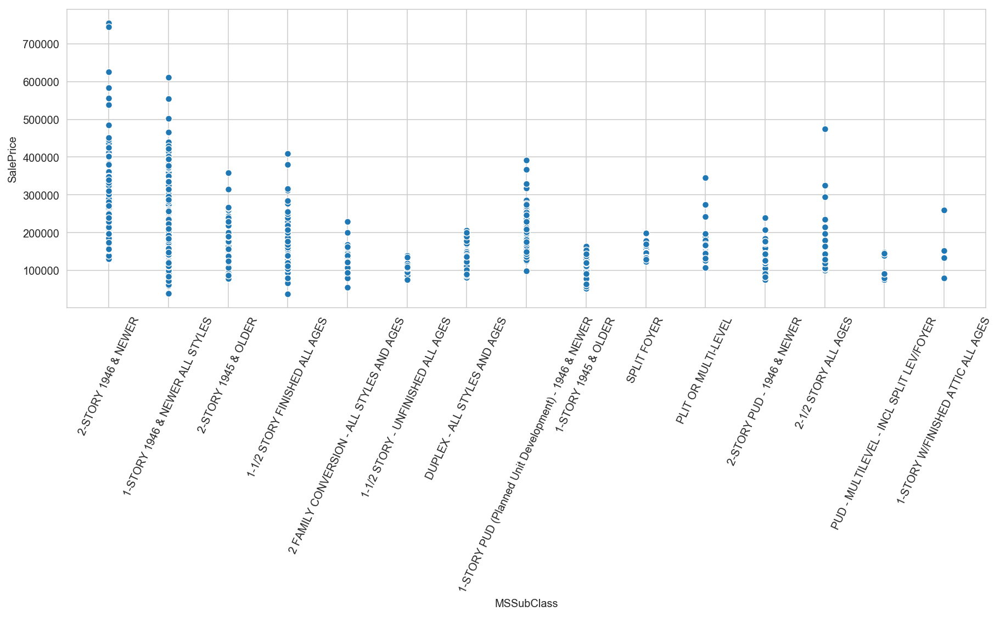

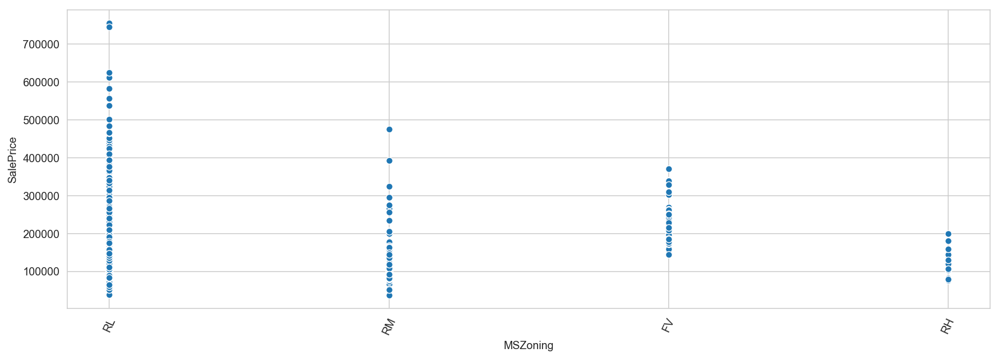

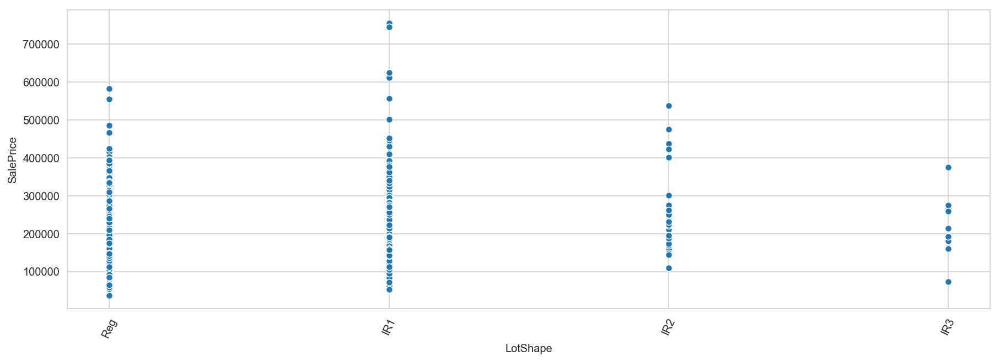

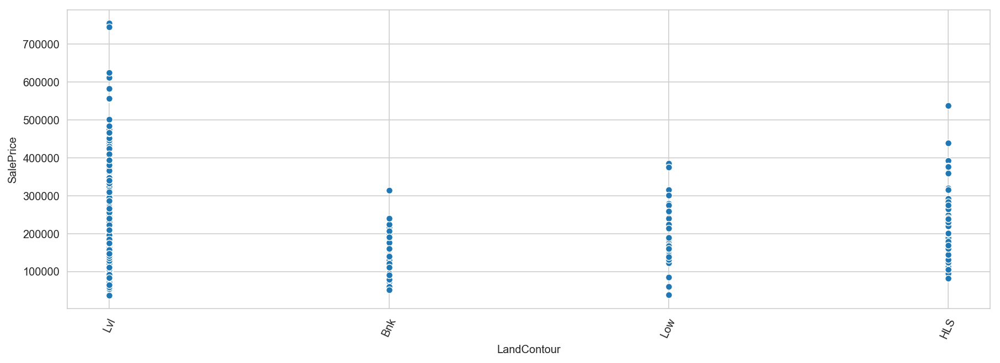

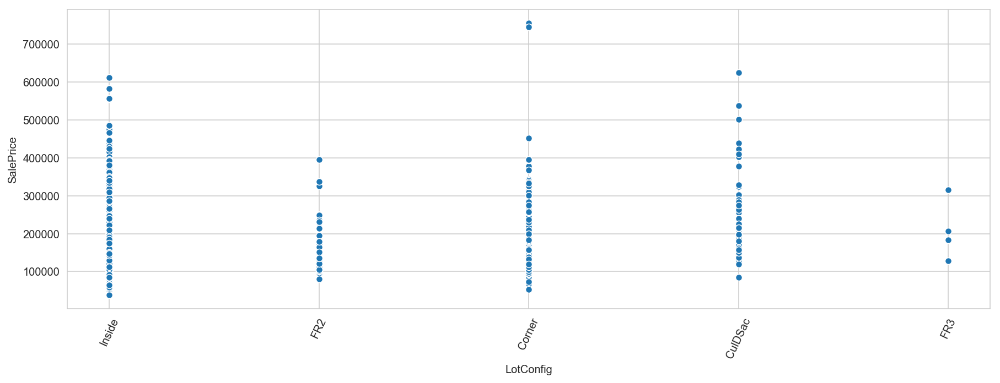

...

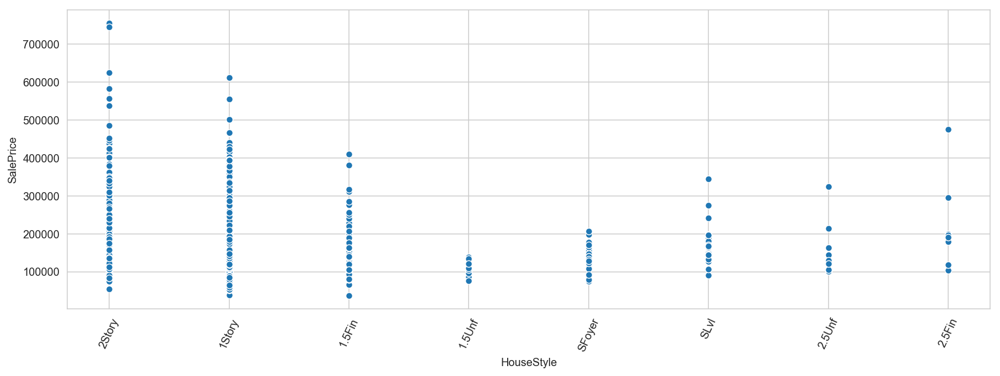

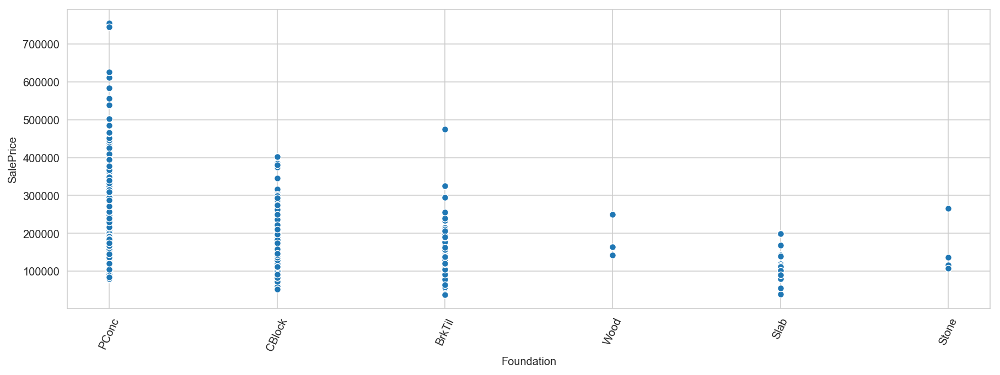

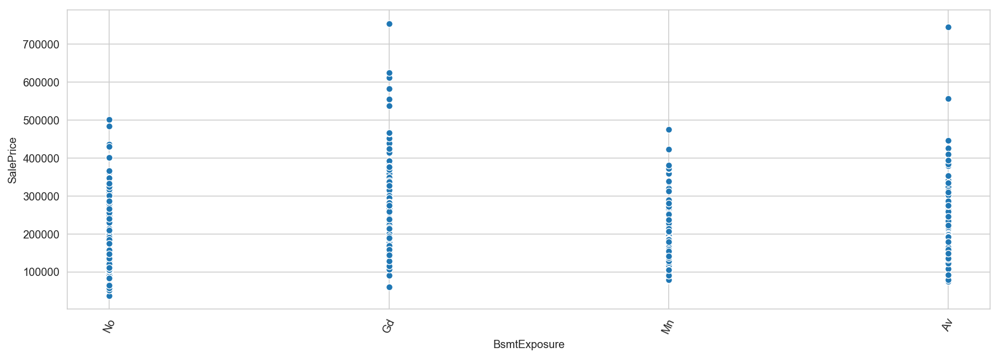

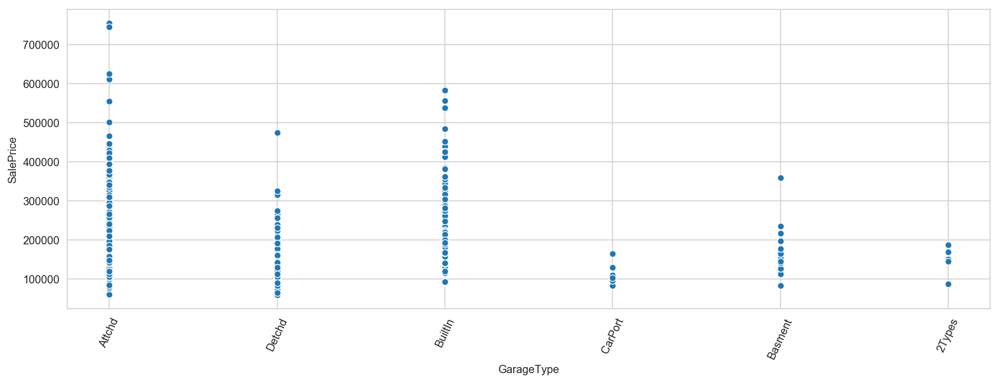

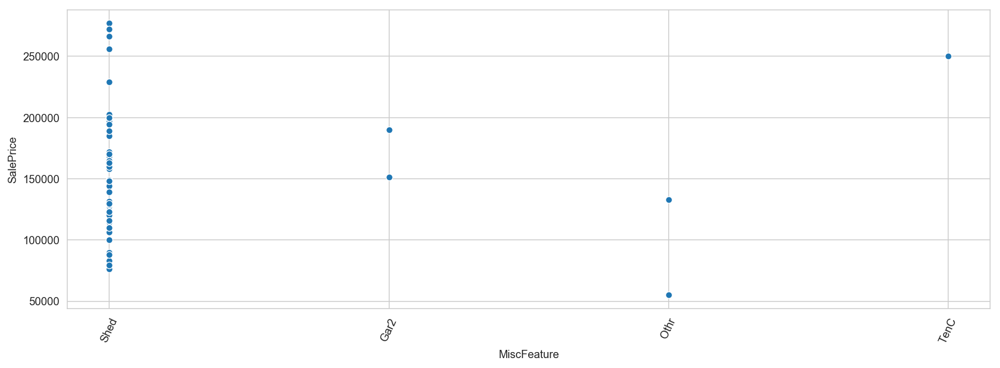

In [19]:
# plot a scatter plot for all fixed categorical features.
# Identify the intercept for the 2 list


fixed_categorical = [x for x in fixed_features if x in categorical]

for i in fixed_categorical:
    fig, ax = plt.subplots(figsize=(15,5))
    sns.scatterplot(x=house[i],y='SalePrice',data=house)
    plt.xticks(rotation=65)

# Interestingly, we can see scatter plots are non-random. we should not be discarding any feature!
# Location provides a very interesting relationship
# Lasso and Ridge regression could provide some insights into the influence of each variable

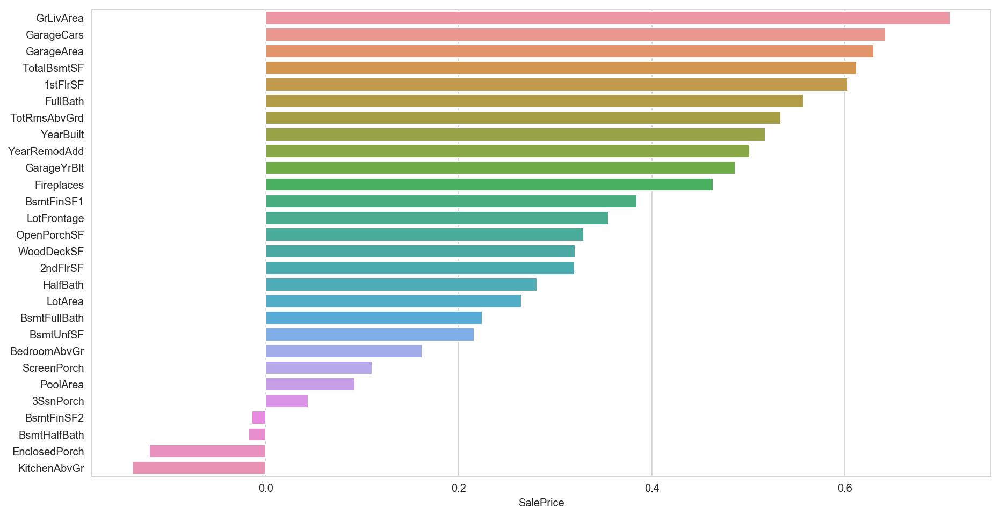

In [20]:
corr_fixed = house[['SalePrice'] + fixed_features].corr()

                   
corr = corr_fixed.sort_values('SalePrice', ascending = False)
plt.figure(figsize=(15,8))
sns.barplot(corr.SalePrice[1:], corr.index[1:], orient='h')
plt.show()

# Garage Cars and Garage Area are both highly correlated with sale price, and are also correlated given the nature
# To drop Garage Cars as a feature
# Basement also appears to be a signifcant feature that affects price

### Replace NA values with appropriate values

Identify NA values in dataset by looking NAs in all columns.
- LotFrontage to replace with mean as mean and median are not far apart.
- Remainder NA columns to replace with 0 as NA indicates feature is not present.

In [21]:
# Identify columns with NA and perform fillna on those columns

NA_columns = house.columns[house.isna().any()].tolist()

print(NA_columns)

['LotFrontage', 'Alley', 'MasVnrType', 'MasVnrArea', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Electrical', 'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence', 'MiscFeature']


In [22]:
# LotFrontage to replace with mean as mean and median are not far apart 
# Remmaider NA columns to replace with 0

house['LotFrontage'].fillna(house['LotFrontage'].mean(), inplace = True)


In [23]:
NA_columns.remove('LotFrontage')
print(NA_columns)

house[NA_columns] = house[NA_columns].fillna(0)

['Alley', 'MasVnrType', 'MasVnrArea', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Electrical', 'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence', 'MiscFeature']


In [24]:
house.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1450 entries, 0 to 1459
Data columns (total 81 columns):
Id               1450 non-null int64
MSSubClass       1450 non-null object
MSZoning         1450 non-null object
LotFrontage      1450 non-null float64
LotArea          1450 non-null int64
Street           1450 non-null int64
Alley            1450 non-null object
LotShape         1450 non-null object
LandContour      1450 non-null object
Utilities        1450 non-null object
LotConfig        1450 non-null object
LandSlope        1450 non-null object
Neighborhood     1450 non-null object
Condition1       1450 non-null object
Condition2       1450 non-null object
BldgType         1450 non-null object
HouseStyle       1450 non-null object
OverallQual      1450 non-null int64
OverallCond      1450 non-null int64
YearBuilt        1450 non-null int64
YearRemodAdd     1450 non-null int64
RoofStyle        1450 non-null object
RoofMatl         1450 non-null object
Exterior1st      1450 non

### Create a dataframe to be used for regression
- Drop GarageCars
- Get dummy variables for categorical data

In [25]:
# house_eda = house.drop('GarageCars', axis=1)

In [26]:
# Create 4 unique list (fixed categorical, fixed non categorical, variable categorical, variable non categorical)

fixed_categorical = [x for x in fixed_features if x in categorical]
fixed_noncategorical = [x for x in fixed_features if x not in categorical]

print(fixed_categorical)

print(fixed_noncategorical)

['MSSubClass', 'MSZoning', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'Foundation', 'BsmtExposure', 'GarageType', 'MiscFeature']
['LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea']


In [27]:
variable_categorical = [x for x in nonfixed_features if x in categorical]
variable_noncategorical = [x for x in nonfixed_features if x not in categorical]

print(variable_categorical)

print(variable_noncategorical)

['Alley', 'Utilities', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'Electrical', 'Functional', 'GarageFinish', 'PavedDrive', 'Fence', 'MoSold', 'YrSold', 'SaleType', 'SaleCondition']
['Street', 'OverallQual', 'OverallCond', 'MasVnrArea', 'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', 'HeatingQC', 'CentralAir', 'LowQualFinSF', 'KitchenQual', 'FireplaceQu', 'GarageQual', 'GarageCond', 'PoolQC', 'MiscVal']


In [28]:
df1 = pd.get_dummies(house[fixed_categorical],drop_first=True)
df2 = house[fixed_noncategorical]

fixed_regression_df = pd.concat([house['SalePrice'],house['MoSold'],house['YrSold'],df1,df2],axis=1)
fixed_regression_df.drop('GarageCars', axis=1, inplace = True)
fixed_regression_df.head()

,SalePrice,MoSold,YrSold,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1945 & OLDER,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_1-STORY W/FINISHED ATTIC ALL AGES,MSSubClass_2 FAMILY CONVERSION - ALL STYLES AND AGES,MSSubClass_2-1/2 STORY ALL AGES,MSSubClass_2-STORY 1945 & OLDER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_2-STORY PUD - 1946 & NEWER,MSSubClass_DUPLEX - ALL STYLES AND AGES,MSSubClass_PLIT OR MULTI-LEVEL,MSSubClass_PUD - MULTILEVEL - INCL SPLIT LEV/FOYER,MSSubClass_SPLIT FOYER,MSZoning_RH,MSZoning_RL,MSZoning_RM,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr_2nd,Condition2_Norm_2nd,Condition2_PosA_2nd,Condition2_PosN_2nd,Condition2_RRAe_2nd,Condition2_RRAn_2nd,Condition2_RRNn_2nd,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtExposure_Av,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,GarageType_2Types,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,MiscFeature_Gar2,MiscFeature_Othr,MiscFeature_Shed,MiscFeature_TenC,LotFrontage,LotArea,YearBuilt,YearRemodAdd,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea
0,208500,2,2008,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,65.0,8450,2003,2003,706,0,150,856,856,854,1710,1,0,2,1,3,1,8,0,2003.0,548,0,61,0,0,0,0
1,181500,5,2007,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,80.0,9600,1976,1976,978,0,284,1262,1262,0,1262,0,1,2,0,3,1,6,1,1976.0,460,298,0,0,0,0,0
2,223500,9,2008,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,68.0,11250,2001,2002,486,0,434,920,920,866,1786,1,0,2,1,3,1,6,1,2001.0,608,0,42,0,0,0,0
3,140000,2,2006,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,60.0,9550,1915,1970,216,0,540,756,961,756,1717,1,0,1,0,3,1,7,1,1998.0,642,0,35,272,0,0,0
4,250000,12,2008,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,84.0,14260,2000,2000,655,0,490,1145,1145,1053,2198,1,0,2,1,4,1,9,1,2000.0,836,192,84,0,0,0,0


In [29]:
# Split fixed_regression_df into training and test sets based on YrSold

fixed_train = fixed_regression_df.loc[fixed_regression_df['YrSold'] != 2010]
fixed_test = fixed_regression_df.loc[fixed_regression_df['YrSold'] == 2010]


In [30]:
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn.linear_model import Ridge
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import Lasso
from sklearn.linear_model import LassoCV
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import ElasticNetCV
from sklearn.preprocessing import StandardScaler


In [31]:
# Define X and Y and pass X through standard scaler

cols = list(fixed_train.columns)
cols.remove('SalePrice')

X = fixed_train[cols]
y = fixed_train['SalePrice'].values

ss = StandardScaler()
Xs = ss.fit_transform(X)

In [32]:
# Using Ridge Regression

# find optimal Ridge alpha

ridge_alphas = np.logspace(0,5,100)

optimal_ridge = RidgeCV(alphas = ridge_alphas, cv = 10)
optimal_ridge.fit(Xs,y)

print(optimal_ridge.alpha_)

print(optimal_ridge.coef_)
print(optimal_ridge.intercept_)

376.49358067924675
[-6.90911489e+01 -5.33687293e+02 -1.02224341e+02 -7.24789222e+02
  2.15574434e+03 -1.55641991e+03  1.16566703e+02 -5.59892581e+02
  5.28627481e+01  6.10603151e+02  7.74334318e+02 -2.74020888e+03
 -1.14529390e+03 -4.26282975e+02 -1.46268036e+02 -3.72089571e+02
 -1.04156561e+02 -1.15667154e+02 -1.27878684e+03  1.54982697e+03
 -2.95093827e+03 -2.26062843e+02  2.30186323e+03  8.93633818e+01
  1.38378927e+03  1.91859138e+03 -1.31222451e+03 -7.51068886e+02
 -7.65793495e+01  1.16418388e+02 -1.63752941e+03  1.88212390e+02
  5.61197433e+02  4.12381316e+02 -1.67959926e+03 -1.96836305e+03
  3.01168907e+03 -4.22478408e+03 -2.98822445e+03 -5.75636963e+02
 -1.45519813e+03 -2.62685203e+03 -2.95872649e+03  2.51606090e+02
 -1.95421715e+03  7.62238027e+03  1.04571690e+04 -1.82968015e+03
 -1.28450466e+03 -1.93925783e+03 -4.82663544e+02  3.65401110e+03
  6.29806277e+03  7.07638794e+01  1.51941681e+03 -1.99140896e+03
  1.51569675e+03  5.30340498e+01  3.01944403e+02 -1.48769655e+03
  3.99

In [33]:
# Calculate cross_val R2 score

ridge = Ridge(alpha = optimal_ridge.alpha_)
ridge_scores = cross_val_score(ridge, Xs, y, cv = 10)

print(ridge_scores)
print('Mean Cross-Validated R2 for Ridge is {:05.4f}'.format(np.mean(ridge_scores)))

[0.89504335 0.82747989 0.85648632 0.76229667 0.80147024 0.76021029
 0.88801811 0.79526547 0.52319216 0.86271803]
Mean Cross-Validated R2 for Ridge is 0.7972


In [34]:
# Using Lasso Regression

# find optimal Lasso alpha

optimal_lasso = LassoCV(n_alphas = 200, cv = 10)
optimal_lasso.fit(Xs, y)

print(optimal_lasso.alpha_)

1033.8891290355798


In [35]:
# Calculate cross_val R2 score

lasso = Lasso(alpha = optimal_lasso.alpha_)
lasso_scores = cross_val_score(lasso, Xs, y, cv = 10)

print(lasso_scores)
print('Mean Cross-Validated R2 for Lasso is {:05.4f}'.format(np.mean(lasso_scores)))

[0.88728197 0.84943257 0.85685865 0.76790312 0.80982072 0.73692339
 0.8861603  0.77930627 0.47869515 0.86236078]
Mean Cross-Validated R2 for Lasso is 0.7915


In [36]:
# Check percentage of variables zeroed out

lasso.fit(Xs, y)
lasso_coefs = pd.DataFrame({'variable':X.columns,
                            'abs_coef':np.abs(optimal_lasso.coef_),
                            'coef':optimal_lasso.coef_,})

print('Percent variables zeroed out:', np.sum((optimal_lasso.coef_ == 0))/float(len(optimal_lasso.coef_))*100,'%')

Percent variables zeroed out: 52.75590551181102 %


In [37]:
lasso_coefs.sort_values(by='abs_coef', ascending = False).round(10).head(20)

,variable,abs_coef,coef
110,GrLivArea,29619.457126,29619.457126
46,Neighborhood_NridgHt,14516.472437,14516.472437
45,Neighborhood_NoRidge,9494.967953,9494.967953
52,Neighborhood_StoneBr,8138.188032,8138.188032
102,YearBuilt,8018.251707,8018.251707
103,YearRemodAdd,7489.583655,7489.583655
120,GarageArea,7353.500784,7353.500784
87,BsmtExposure_Gd,5920.574439,5920.574439
51,Neighborhood_Somerst,5685.130055,5685.130055
116,KitchenAbvGr,5314.725288,-5314.725288


### Testing the model on 2010 test data

In [38]:
# Define X and Y and pass X through standard scaler

cols = list(fixed_test.columns)
cols.remove('SalePrice')

X_test = fixed_test[cols]
y_test = fixed_test['SalePrice'].values

ss = StandardScaler()
Xs_test = ss.fit_transform(X_test)

In [39]:
# Calculate cross_val R2 score

ridge = Ridge(alpha = optimal_ridge.alpha_)
ridge_scores = cross_val_score(ridge, Xs_test, y_test, cv = 10)

print(ridge_scores)
print('Mean Cross-Validated R2 for Ridge is {:05.4f}'.format(np.mean(ridge_scores)))

[0.73078661 0.8374495  0.87296186 0.72631337 0.77263974 0.76064889
 0.53577464 0.89060419 0.74925135 0.75511379]
Mean Cross-Validated R2 for Ridge is 0.7632


In [40]:
# Calculate cross_val R2 score

lasso = Lasso(alpha = optimal_lasso.alpha_)
lasso_scores = cross_val_score(lasso, Xs_test, y_test, cv = 10)

print(lasso_scores)
print('Mean Cross-Validated R2 for Lasso_test is {:05.4f}'.format(np.mean(lasso_scores)))

[0.62711374 0.6065519  0.89605137 0.78220613 0.65303152 0.89903678
 0.64602041 0.9257269  0.72554314 0.82113033]
Mean Cross-Validated R2 for Lasso_test is 0.7582


Both Models perform slightly worse on the 2010 test set compared to training set, but the difference appears tolerable

R2 scores for Ridge Regression on Train vs Test is 79.72% vs 76.32%, a 3.4% drop in accuracy
R2 scores for Lasso Regression on Train vs Test is 79.15% vs 75.82%, a 3.3% drop in accuracy

Based on the coefficients, the largest contributing factor to sales price is area, which is common understanding that bigger houses should sell for higher prices.
Location also comes up high occupying the 2nd to 4th spots, which is also common understanding where prices of property is highly dependent on their location.

Based on above factors, the first factor to consider for purchaing houses for reinvestment, should be the size and location.
Also, newer houses and houses with garages and basements also rank high in the top 15 categories to be observed.



<img src="http://imgur.com/l5NasQj.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## 2. Determine any value of *changeable* property characteristics unexplained by the *fixed* ones.

---

Now that you have a model that estimates the price of a house based on its static characteristics, we can move forward with part 2 and 3 of the plan: what are the costs/benefits of quality, condition, and renovations?

There are two specific requirements for these estimates:
1. The estimates of effects must be in terms of dollars added or subtracted from the house value. 
2. The effects must be on the variance in price remaining from the first model.

The residuals from the first model (training and testing) represent the variance in price unexplained by the fixed characteristics. Of that variance in price remaining, how much of it can be explained by the easy-to-change aspects of the property?

---

**Your goals:**
1. Evaluate the effect in dollars of the renovate-able features. 
- How would your company use this second model and its coefficients to determine whether they should buy a property or not? Explain how the company can use the two models you have built to determine if they can make money. 
- Investigate how much of the variance in price remaining is explained by these features.
- Do you trust your model? Should it be used to evaluate which properties to buy and fix up?

In [41]:
# Compute Residuals based on previous model trained

cols = list(fixed_regression_df.columns)
cols.remove('SalePrice')

X = fixed_regression_df[cols]
y = fixed_regression_df['SalePrice'].values

ss = StandardScaler()
Xs = ss.fit_transform(X)

ridge.fit(Xs, y)
lasso.fit(Xs, y)

ridge_resid = y - ridge.predict(Xs)
lasso_resid = y - lasso.predict(Xs)

In [42]:
ridge_resid

array([   763.25419003, -25336.2887595 ,   8155.96612948, ...,
        28139.51873055,   7109.18059176,  -3689.70716606])

In [43]:
lasso_resid

array([  4652.2042942 , -18862.30583976,   9331.68162378, ...,
        28565.04143938,   4630.28214009,   5691.2051302 ])

In [44]:
# Construct the variable regression dataframe based on the variable factors

df3 = pd.get_dummies(house[variable_categorical],drop_first=True)
df4 = house[variable_noncategorical]

variable_regression_df = pd.concat([house['SalePrice'],df3,df4],axis=1)
# variable_regression_df.drop('GarageCars', axis=1, inplace = True)
variable_regression_df.head()

,SalePrice,MoSold,YrSold,Alley_Grvl,Alley_Pave,Utilities_NoSeWa,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn_2nd,Exterior2nd_Brk Cmn_2nd,Exterior2nd_BrkFace_2nd,Exterior2nd_CBlock_2nd,Exterior2nd_CmentBd_2nd,Exterior2nd_HdBoard_2nd,Exterior2nd_ImStucc_2nd,Exterior2nd_MetalSd_2nd,Exterior2nd_Other_2nd,Exterior2nd_Plywood_2nd,Exterior2nd_Stone_2nd,Exterior2nd_Stucco_2nd,Exterior2nd_VinylSd_2nd,Exterior2nd_Wd Sdng_2nd,Exterior2nd_Wd Shng_2nd,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,BsmtFinType1_ALQ,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_ALQ,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,Electrical_FuseA,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,GarageFinish_Fin,GarageFinish_RFn,GarageFinish_Unf,PavedDrive_P,PavedDrive_Y,Fence_GdPrv,Fence_GdWo,Fence_MnPrv,Fence_MnWw,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,Street,OverallQual,OverallCond,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,HeatingQC,CentralAir,LowQualFinSF,KitchenQual,FireplaceQu,GarageQual,GarageCond,PoolQC,MiscVal
0,208500,2,2008,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,7,5,196.0,4,3,4.0,3.0,5,1,0,4,0.0,3.0,3.0,0.0,0
1,181500,5,2007,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,6,8,0.0,3,3,4.0,3.0,5,1,0,3,3.0,3.0,3.0,0.0,0
2,223500,9,2008,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,7,5,162.0,4,3,4.0,3.0,5,1,0,4,3.0,3.0,3.0,0.0,0
3,140000,2,2006,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,7,5,0.0,3,3,3.0,4.0,4,1,0,4,4.0,3.0,3.0,0.0,0
4,250000,12,2008,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,8,5,350.0,4,3,4.0,3.0,5,1,0,4,3.0,3.0,3.0,0.0,0


In [45]:
# Append the residuals to the dataframe. This will be the Y values used to perform variable regression

variable_regression_df['ridge_residual'] = ridge_resid.tolist()
variable_regression_df['lasso_residual'] = lasso_resid.tolist()


In [46]:
variable_regression_df.head()

,SalePrice,MoSold,YrSold,Alley_Grvl,Alley_Pave,Utilities_NoSeWa,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn_2nd,Exterior2nd_Brk Cmn_2nd,Exterior2nd_BrkFace_2nd,Exterior2nd_CBlock_2nd,Exterior2nd_CmentBd_2nd,Exterior2nd_HdBoard_2nd,Exterior2nd_ImStucc_2nd,Exterior2nd_MetalSd_2nd,Exterior2nd_Other_2nd,Exterior2nd_Plywood_2nd,Exterior2nd_Stone_2nd,Exterior2nd_Stucco_2nd,Exterior2nd_VinylSd_2nd,Exterior2nd_Wd Sdng_2nd,Exterior2nd_Wd Shng_2nd,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,BsmtFinType1_ALQ,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_ALQ,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,Electrical_FuseA,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,GarageFinish_Fin,GarageFinish_RFn,GarageFinish_Unf,PavedDrive_P,PavedDrive_Y,Fence_GdPrv,Fence_GdWo,Fence_MnPrv,Fence_MnWw,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,Street,OverallQual,OverallCond,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,HeatingQC,CentralAir,LowQualFinSF,KitchenQual,FireplaceQu,GarageQual,GarageCond,PoolQC,MiscVal,ridge_residual,lasso_residual
0,208500,2,2008,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,7,5,196.0,4,3,4.0,3.0,5,1,0,4,0.0,3.0,3.0,0.0,0,763.254190,4652.204294
1,181500,5,2007,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,6,8,0.0,3,3,4.0,3.0,5,1,0,3,3.0,3.0,3.0,0.0,0,-25336.288759,-18862.305840
2,223500,9,2008,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,7,5,162.0,4,3,4.0,3.0,5,1,0,4,3.0,3.0,3.0,0.0,0,8155.966129,9331.681624
3,140000,2,2006,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,7,5,0.0,3,3,3.0,4.0,4,1,0,4,4.0,3.0,3.0,0.0,0,-45448.867878,-41365.348627
4,250000,12,2008,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,8,5,350.0,4,3,4.0,3.0,5,1,0,4,3.0,3.0,3.0,0.0,0,-57365.961556,-61475.868536


In [47]:
# Lets try doing the Ridge Regression on variable factors, based on ridge residuals

cols = list(variable_regression_df.columns)
cols.remove('SalePrice')
cols.remove('MoSold')
cols.remove('YrSold')
cols.remove('ridge_residual')
cols.remove('lasso_residual')

X = variable_regression_df[cols]
y = variable_regression_df['ridge_residual'].values

ss = StandardScaler()
Xs = ss.fit_transform(X)


In [48]:
# find optimal Ridge alpha

ridge_alphas = np.logspace(0,5,100)

optimal_ridge = RidgeCV(alphas = ridge_alphas, cv = 10)
optimal_ridge.fit(Xs,y)

print(optimal_ridge.alpha_)

print(optimal_ridge.coef_)
print(optimal_ridge.intercept_)

1072.2672220103232
[-1.31756969e+02 -2.11962543e+01 -5.00209785e+02 -1.09172201e+03
  1.26582609e+02  9.40401222e+02  3.27950641e+02  4.41535262e+02
  9.79145308e+02  9.37409047e+02  4.37335152e+02  2.88740532e+02
 -1.31351787e+02  1.64002465e+02  3.48744478e+03  2.82432056e+01
 -2.73300395e+02  1.55540074e+03 -4.20121912e+01  6.68344672e+02
 -3.04178564e+02 -4.52120752e+02  3.81520212e+02 -3.22054645e+02
  5.00847787e+01 -5.00709481e+02 -4.30231479e+02 -2.73414525e+02
  2.03741774e+02  4.58335695e+01  1.57600694e+02  4.40639863e+02
 -4.20121912e+01  7.42720750e+02 -2.91902039e+02  1.13688952e+03
  3.37579865e+02 -5.44750011e+02 -5.25444892e+02 -4.22119344e+02
 -1.00116164e+03 -1.47728052e+02  4.14006750e+02 -5.39071827e+02
 -6.26669401e+02 -3.31596722e+02  4.85418486e+02  9.85325978e+01
 -1.77657835e+02  2.02542720e+02  4.66002110e+02 -2.20779139e+02
  3.38923678e+02 -8.61419017e+02  5.10253693e+02 -2.26900155e+02
  3.10300137e+02 -2.16880361e+01 -1.59753506e+02 -3.64476398e+02
 -2.81

In [49]:
# Calculate cross_val R2 score

ridge = Ridge(alpha = optimal_ridge.alpha_)
ridge_scores = cross_val_score(ridge, Xs, y, cv = 10)

print(ridge_scores)
print('Mean Cross-Validated R2 for Ridge is {:05.4f}'.format(np.mean(ridge_scores)))

[ 0.12177477  0.19976     0.18277751 -0.00822812  0.22155762  0.18183724
  0.18884356  0.07328308 -0.01844661  0.06060513]
Mean Cross-Validated R2 for Ridge is 0.1204


In [50]:
# Lets try doing the Lasso Regression on variable factors, based on lasso residuals

cols = list(variable_regression_df.columns)
cols.remove('SalePrice')
cols.remove('MoSold')
cols.remove('YrSold')
cols.remove('ridge_residual')
cols.remove('lasso_residual')

X = variable_regression_df[cols]
y = variable_regression_df['lasso_residual'].values

ss = StandardScaler()
Xs = ss.fit_transform(X)

In [51]:
# find optimal Lasso alpha

optimal_lasso = LassoCV(n_alphas = 500, cv = 10)
optimal_lasso.fit(Xs, y)

print(optimal_lasso.alpha_)

1007.0906015661866


In [52]:
# Calculate cross_val R2 score

lasso = Lasso(alpha = optimal_lasso.alpha_)
lasso_scores = cross_val_score(lasso, Xs, y, cv = 10)

print(lasso_scores)
print('Mean Cross-Validated R2 for Lasso is {:05.4f}'.format(np.mean(lasso_scores)))

[0.1209251  0.26189637 0.18648498 0.02756422 0.22569183 0.17519135
 0.15933719 0.06288087 0.01575778 0.05235613]
Mean Cross-Validated R2 for Lasso is 0.1288


In [53]:
# Check percentage of variables zeroed out

lasso.fit(Xs, y)
lasso_coefs = pd.DataFrame({'variable':X.columns,
                            'abs_coef':np.abs(optimal_lasso.coef_),
                            'coef':optimal_lasso.coef_,})

print('Percent variables zeroed out:', np.sum((optimal_lasso.coef_ == 0))/float(len(optimal_lasso.coef_))*100,'%')

Percent variables zeroed out: 77.39130434782608 %


In [54]:
lasso_coefs.sort_values(by='abs_coef', ascending = False).round(10).head(20)

,variable,abs_coef,coef
14,RoofMatl_WdShngl,5410.881457,5410.881457
99,OverallQual,4206.043085,4206.043085
100,OverallCond,4002.221153,4002.221153
75,Functional_Typ,3151.811220,3151.811220
77,GarageFinish_RFn,2454.130937,-2454.130937
8,RoofMatl_CompShg,2264.518843,2264.518843
90,SaleType_New,2218.866165,2218.866165
17,Exterior1st_BrkFace,2090.256696,2090.256696
3,RoofStyle_Gable,1607.129979,-1607.129979
69,Electrical_SBrkr,1128.431306,-1128.431306




The R2 score on the renovateable features are 12.04% on Ridge and 12.88% on Lasso respectively
This is a lower score compared to the fixed features which range in the 80%

The regression is done by matching the residual (i.e.~ 20% unexplained) from the fixed feature regression against the variable features.
The inherent assumption is therefore fixed feature regression would account for 100% and hence the 20% unexplained can be fully explained by variable feature regression.
This assumption might not hold true given the low R2 score



In [55]:
lasso_coefs.loc[lasso_coefs['variable'] == 'BsmtQual']

,variable,abs_coef,coef
104,BsmtQual,0.0,0.0


In [56]:
lasso_coefs.loc[lasso_coefs['variable'] == 'BsmtCond']

,variable,abs_coef,coef
105,BsmtCond,0.0,-0.0




Alternatively, we can consider further feature reengineering on the variable columns.

Note the residual can be +ve or -ve.
Recall from our fixed feature regression, basement is an important feature in the top10 important fixed feature.
Basement quality is represented from 0-5 with 0 as no basement. 
Basement quality has 0 coefficient based on lasso: i.e. having no basement has NO PENALTY
We can perhaps introduce a penalty for no basement instead of having the value as 0.

This can be done by relooking at the equation y=beta1(Basement quality) + beta2(Basement indicator)
A new feature 'Basement Indicator' can be created such that 1=No basement, 0=Yes Basement
If Lasso regression can introduce a negative beta2 for the new feature, this can include a penalty for not having basements
Such a penalty can PERHAPS explain for the negative residual



In conclusion, whilst the fixed feature regression model seems reasonable, the variable regression model requires more input to improve on its accuracy

<img src="http://imgur.com/GCAf1UX.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## 3. What property characteristics predict an "abnormal" sale?

---

The `SaleCondition` feature indicates the circumstances of the house sale. From the data file, we can see that the possibilities are:

       Normal	Normal Sale
       Abnorml	Abnormal Sale -  trade, foreclosure, short sale
       AdjLand	Adjoining Land Purchase
       Alloca	Allocation - two linked properties with separate deeds, typically condo with a garage unit	
       Family	Sale between family members
       Partial	Home was not completed when last assessed (associated with New Homes)
       
One of the executives at your company has an "in" with higher-ups at the major regional bank. His friends at the bank have made him a proposal: if he can reliably indicate what features, if any, predict "abnormal" sales (foreclosures, short sales, etc.), then in return the bank will give him first dibs on the pre-auction purchase of those properties (at a dirt-cheap price).

He has tasked you with determining (and adequately validating) which features of a property predict this type of sale. 

---

**Your task:**
1. Determine which features predict the `Abnorml` category in the `SaleCondition` feature.
- Justify your results.

This is a challenging task that tests your ability to perform classification analysis in the face of severe class imbalance. You may find that simply running a classifier on the full dataset to predict the category ends up useless: when there is bad class imbalance classifiers often tend to simply guess the majority class.

It is up to you to determine how you will tackle this problem. I recommend doing some research to find out how others have dealt with the problem in the past. Make sure to justify your solution. Don't worry about it being "the best" solution, but be rigorous.

Be sure to indicate which features are predictive (if any) and whether they are positive or negative predictors of abnormal sales.

In [57]:
# A: